### We have learned and read a lot about how does CNN work. 
### However, it was interesting for me to understand why did the ConvNet decide to classify the image to that particular class. What elements did it relly on to chose the class. And actually how does the ConvNet see the images.
### In order to answer all that question I would use Class Activation Map. More details are here <http://cnnlocalization.csail.mit.edu/>. 


The idea of the method very quickly comes to mind after looking at the next picture, that I found in the link above.

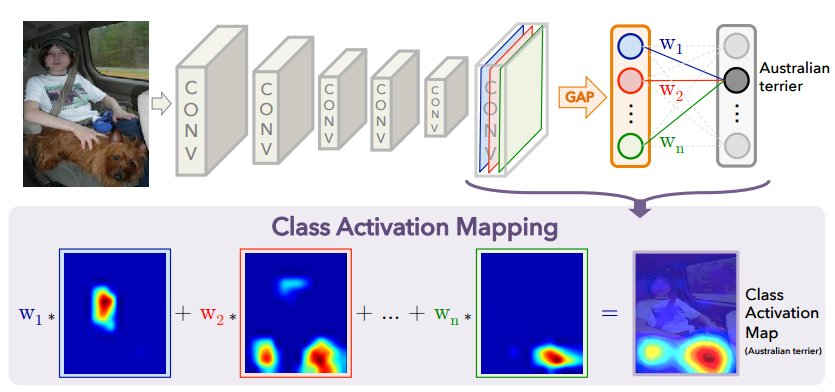

In [5]:
from IPython.display import Image
Image(filename="/home/veronika/materials/cv/CAM/framework.jpg")

Let's assume that we have chosen CNN topology. In my case it is GoogLeNet. Somewhere in the end of the topology we have to take a set of featuremaps that we got after last convolutional layer and apply GAP for each of feature maps. GAP is Global Avarage Pooling. In the paper you may read why we have to use avarage pooling and not maxpooling. As the result, we would get a vector with lenght that is equal to feature maps' amount. The next layer is softmax, as we have classification problem. The input to softmax is a sum of weights multiplied by values of the vector, that we got after Avarage Polling layer. We can understand the weights as the measure how important was the featuremap for particular class detection. In order to get a class activation map we have to simply add all featuremaps multiplied by its weights. Class Activation Map is actually the way how ConvNet see the images! Using CAM we can look at objects, that were the most significant for class decision. Also, it can help us to understand why ConvNet makes mistakes on particular classes, by analysing CAM of wrong predicted classes. 
Moreover, we can solve detection problem in a semi-supervised way, without using marked bboxes. More about it in the paper.
To sum up, I think this is very useful and easy to understand techique that can solve lots of problem!

Before we start we have to change the topology! We have to delete all layers after inception4 to prob and add one convolutional layer of size 3 × 3, stride 1, pad 1 with 1024 units, followed by a GAP layer and a softmax layer.

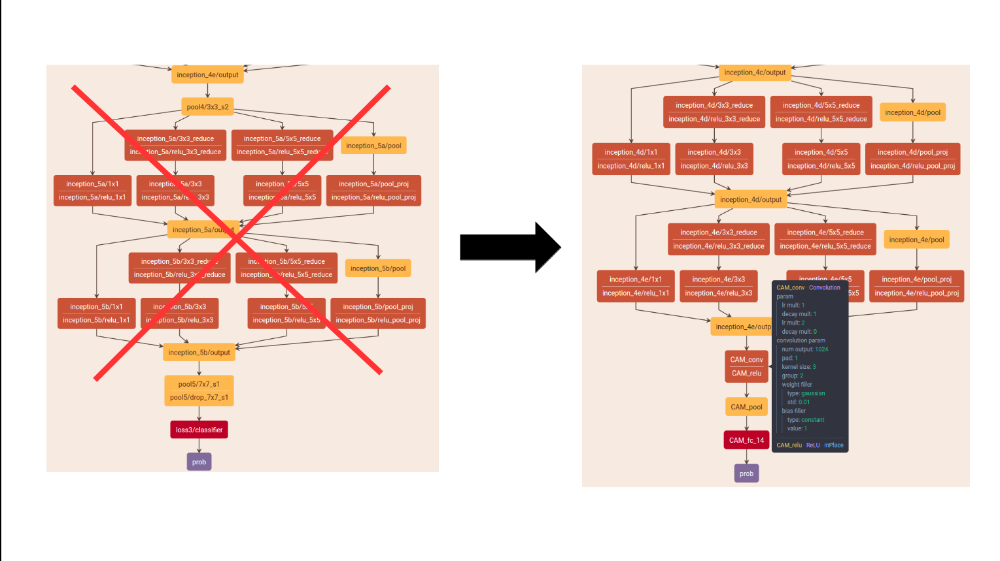

In [2]:
Image(filename="/home/veronika/materials/cv/CAM/newstr.png")

In order to get good results for MPII dataset, I have downloaded pretrained model and performed transfer learning to get as otput a vector of probabilities for 14 classes.
Using usual GoogleNet network I got 95% accuracy after 3600 iterations. As it is said in the paper, the accuracy drops not very significant.However in my case, saving the same learning rate policies I got only 0.73% accuracy after the same number of iterations. So, I decided to finetuning my model. My new learning rate policy is:
***base_lr: 0.0005
lr_policy: "step"
stepsize: 2000***
that gave me 95% accuracy after 3000 iteration.

You may fing learning curves for train and test set in the plot below.

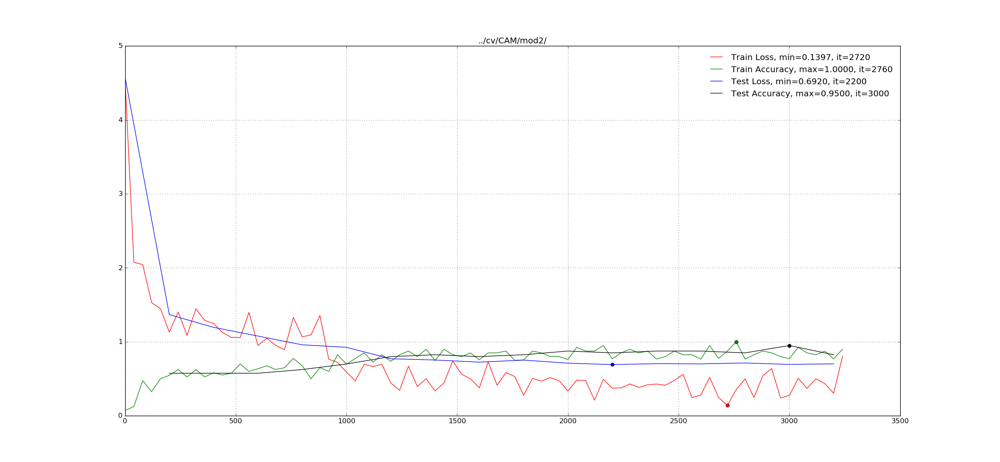

In [3]:
Image(filename="/home/veronika/materials/cv/CAM/mod2/mod2.png")

My code for playing eith CAM.

In [4]:
import caffe
import numpy as np
import cv2
import matplotlib.pylab as plt
import sys
import pandas as pd

/usr/local/lib/python2.7/dist-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [5]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (16, 12)

All files for caffe training were retrained for MPII dataset using transfer learning.

In [6]:
deploy_file  = "/home/veronika/materials/cv/CAM/deploy_googlenetCAM.prototxt"
weights_file = "/home/veronika/materials/cv/CAM/mod2/snapshot/_iter_3000.caffemodel"

caffe.set_device(0)
caffe.set_mode_gpu()

In [12]:
class_label = pd.read_csv("/home/veronika/materials/cv/detection/class_labels.csv", sep = " ", header = None)


In [7]:
net = caffe.Net(deploy_file, weights_file, caffe.TEST)

In [ ]:
###for getting shapes of featuremaps
for layer_name, blob in net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)

In [ ]:
###for getting shapes of weights
for layer_name, param in net.params.iteritems():
    print layer_name + '\t' + str(param[0].data.shape), str(param[1].data.shape)

In [8]:
image_resize = 224
image = caffe.io.load_image('/home/veronika/materials/cv/cv_organizer/mydata/test/034947412.jpg')
net.blobs['data'].reshape(1,3,image_resize,image_resize)
transformer = caffe.io.Transformer({'data': net.blobs['data'].data.shape})
transformer.set_transpose('data', (2, 0, 1))
transformer.set_mean('data', np.array([104,117,123])) # mean pixel
transformer.set_raw_scale('data', 255)  # the reference model operates on images in [0,255] range instead of [0,1]
transformer.set_channel_swap('data', (2,1,0))

transformed_image = transformer.preprocess('data', image)
net.blobs['data'].data[...] = transformed_image
detections = net.forward()['prob']

In [9]:
weights = net.params['CAM_fc_14'][0].data
feature_maps = net.blobs['CAM_conv'].data[0]
print("Shape of weights:" + " " + str(weights.shape))
print("Shape of featuremaps:" + " " + str(feature_maps.shape))

weights = np.array(weights,dtype=np.float)
feature_maps = np.array(feature_maps,dtype=np.float)

###everything as in the first picture
heat_map = np.zeros([14,14],dtype = np.float)
for i in range(1024):
    w = weights[detections.argmax()][i]
    heat_map = heat_map + w*feature_maps[i]
heat_map = cv2.resize(heat_map,(224,224))

Shape of weights: (14, 1024)
Shape of featuremaps: (1024, 14, 14)


In [10]:
detections.argmax()

9

In [13]:
action_label = class_label.loc[class_label[0] == detections.argmax()][1]
print("Class activities is" + " " + str(np.array(action_label)))
image_description = "Class activities is" + " " + str(np.array(action_label))

Class activities is ['music_playing']


Plotting an input image

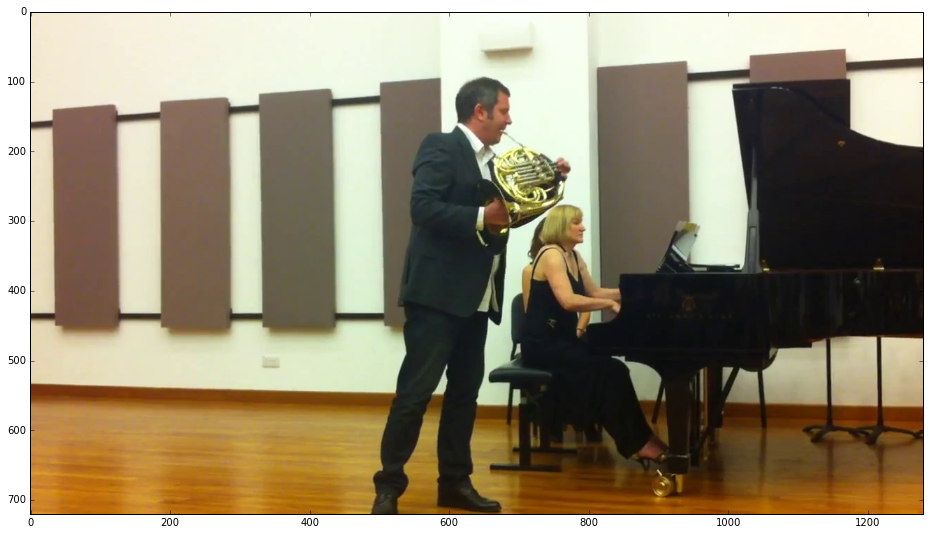

In [14]:
plt.imshow(image)

Plotting a heatmap of input image.

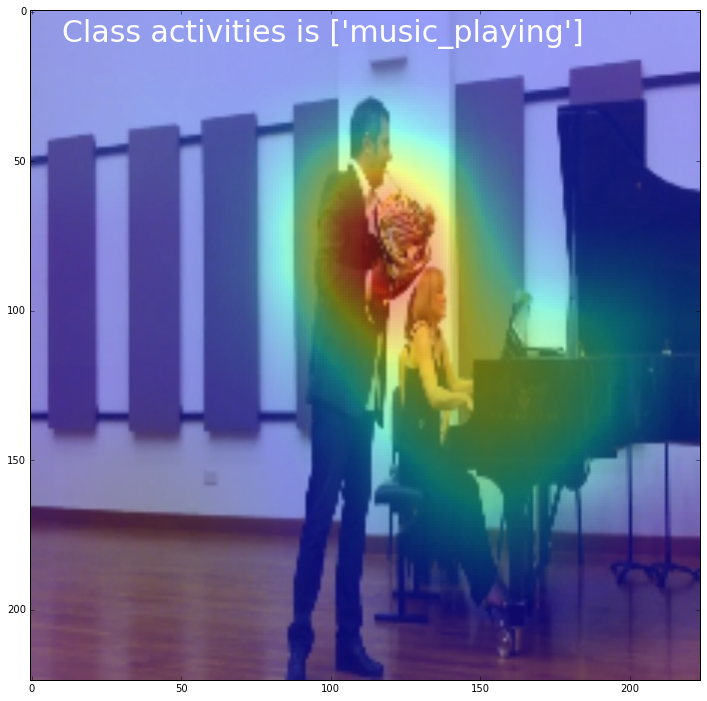

In [16]:
image = cv2.resize(image,(224,224))
ax = plt.subplot(111)
plt.imshow(image)
plt.imshow(heat_map,alpha=0.4, interpolation='nearest')
plt.text(10, 10, image_description, {'color': 'w', 'fontsize': 30})
plt.show()

**It is fantastic!** As we can see in order to predict class *music_playing* the ConvNet "looked" only at small region that is a musical instrument!
Let's look at more examples.

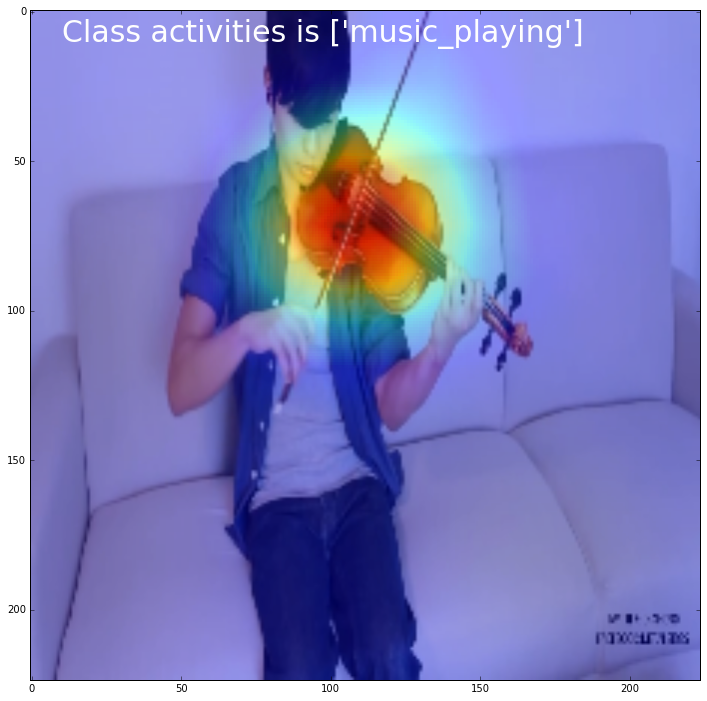

In [16]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/6.png", width=420)

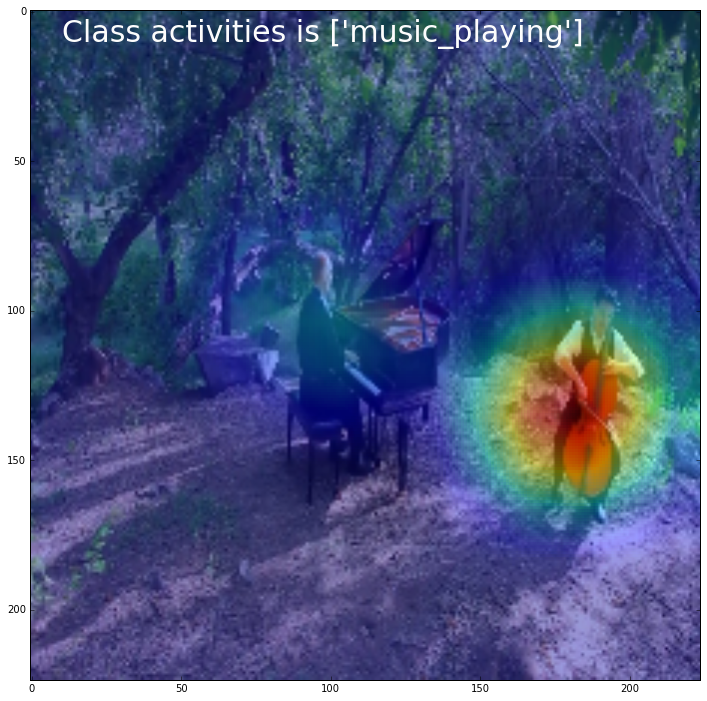

In [17]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/17.png", width=420)

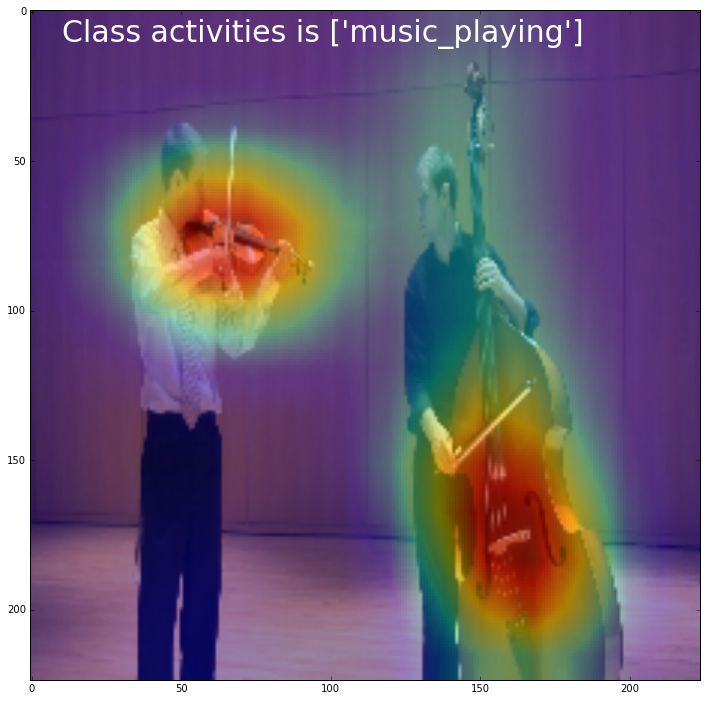

In [19]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/0.png", width=420)

What about other classes?

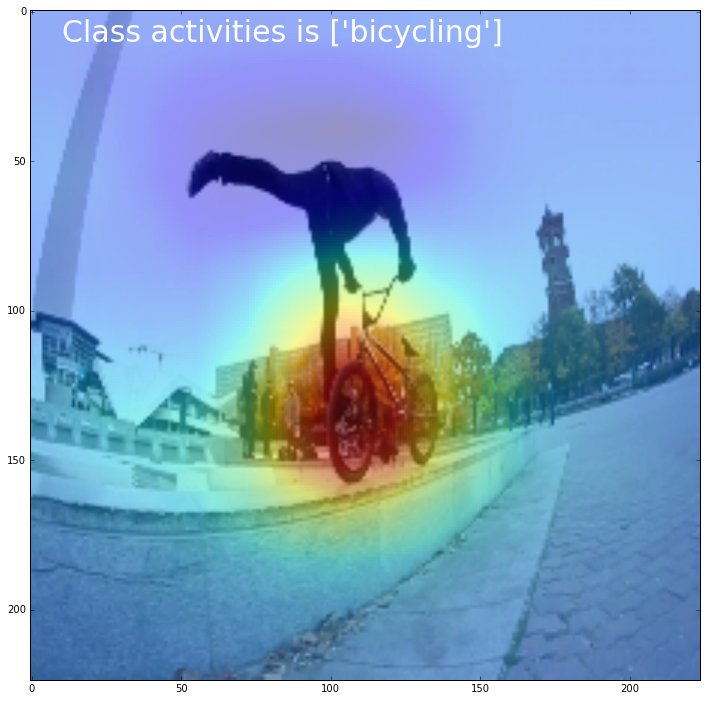

In [20]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/1.png", width=420)


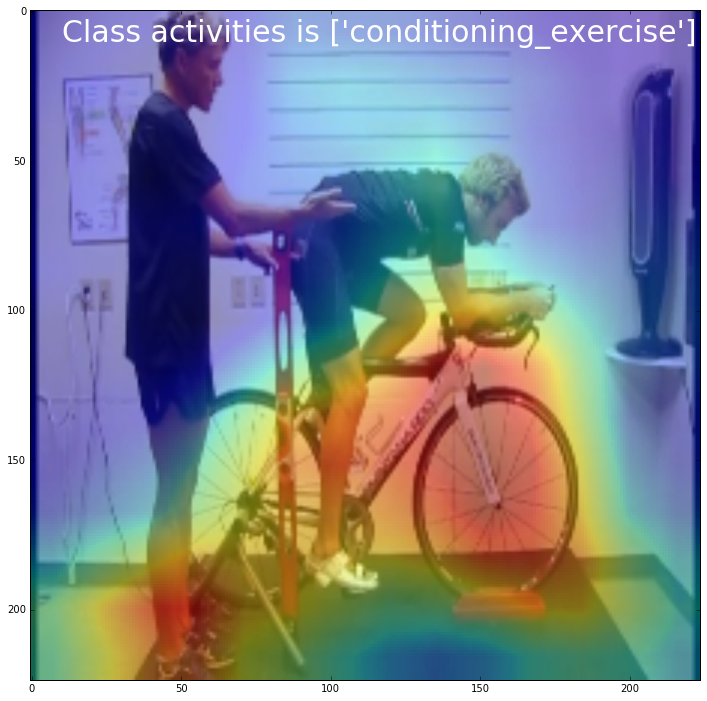

In [21]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/10.png", width=420)

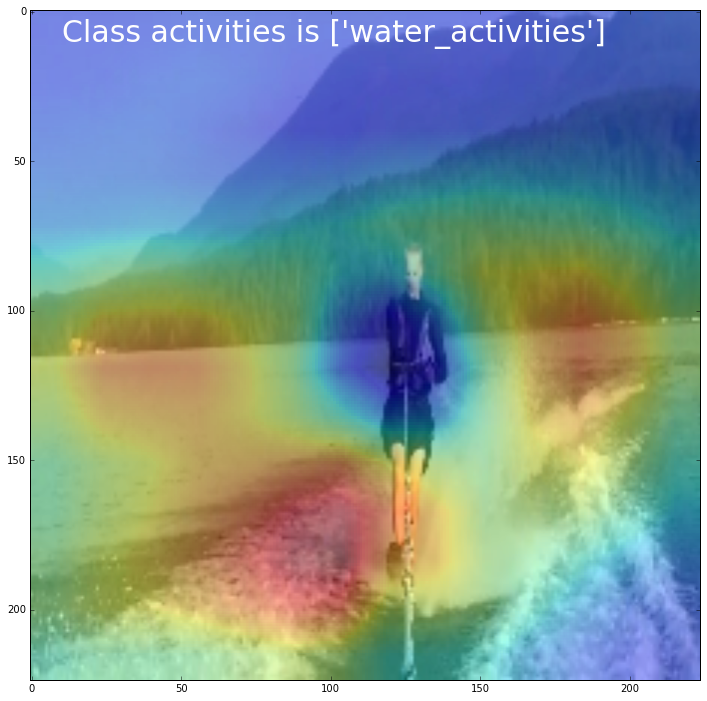

In [22]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/3.png", width=420)

I think it is very interesting how ConvNet may exlude some objects, like person and look only around the object.

My ConvNet can even look at very tine elements of picture

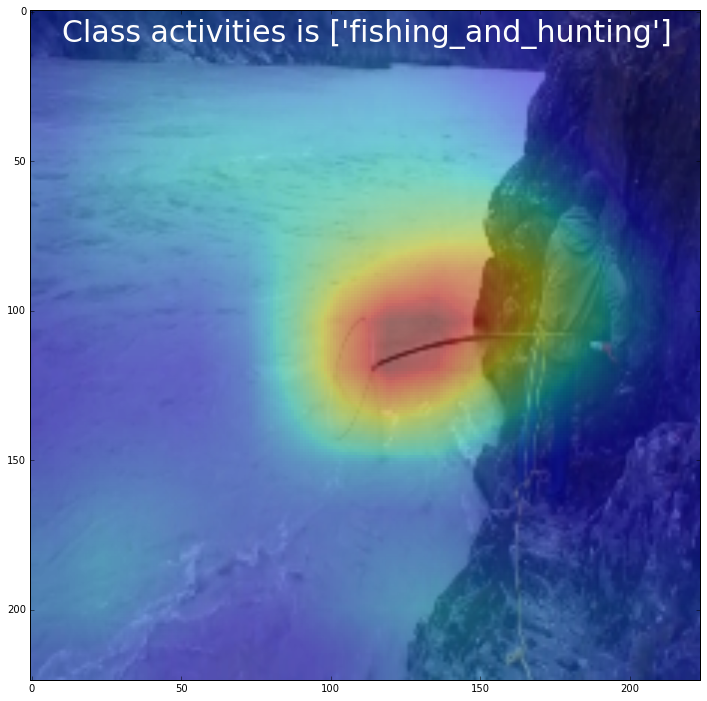

In [23]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/25.png", width=420)

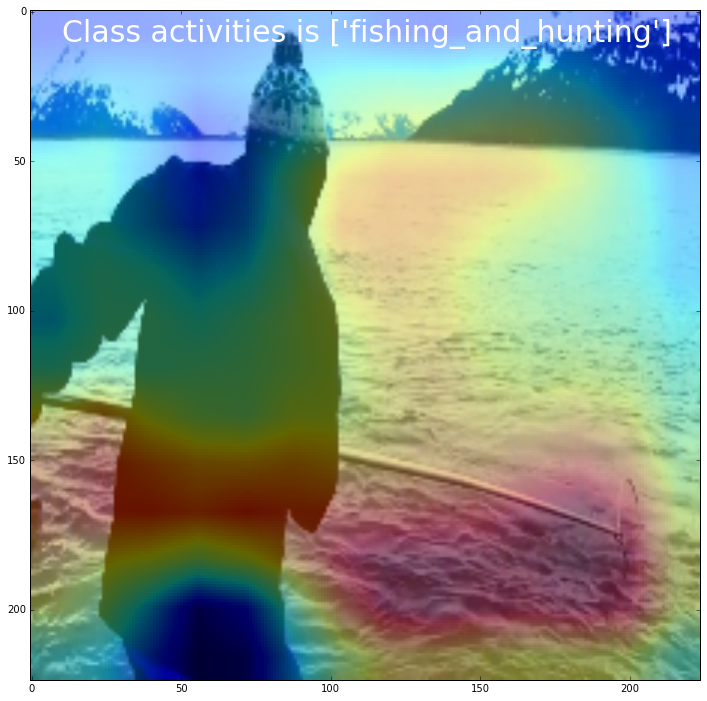

In [24]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/9.png", width=420)

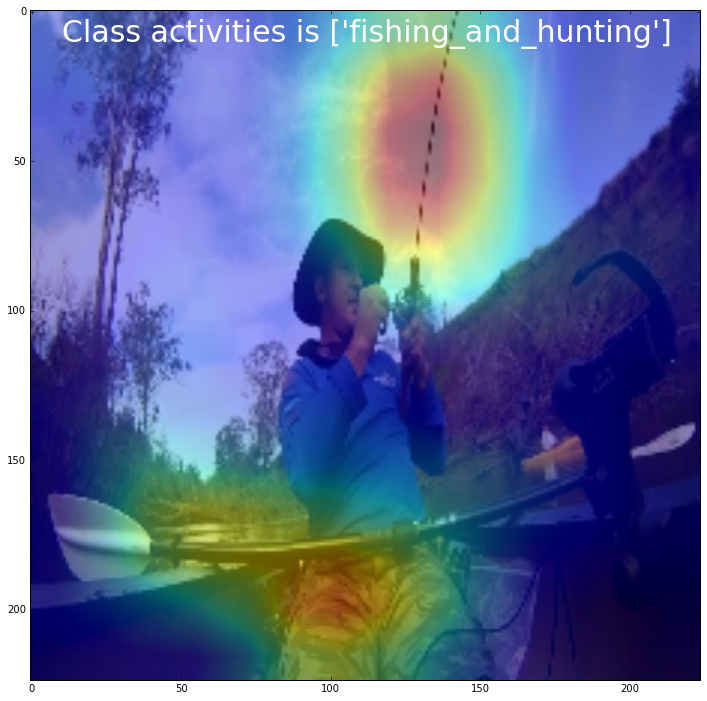

In [25]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/13.png", width=420)

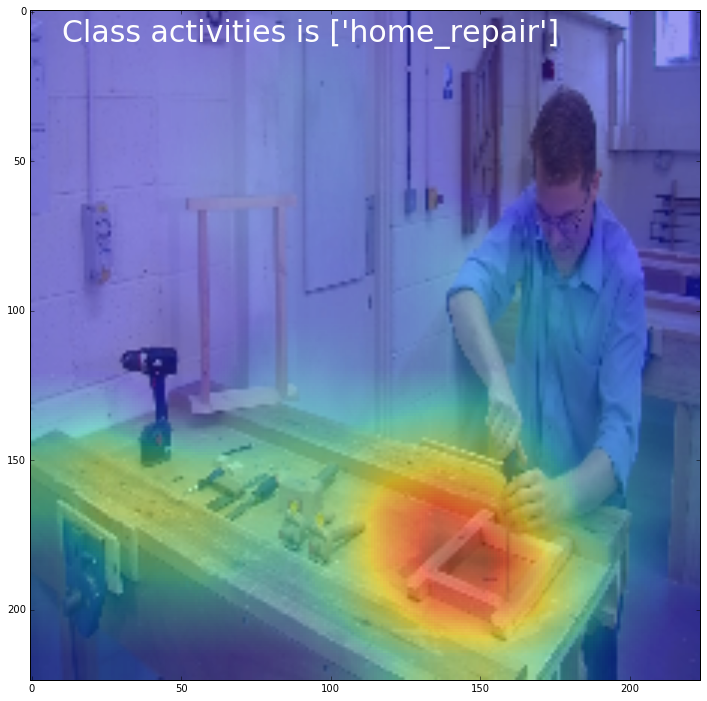

In [26]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/2.png", width=420)

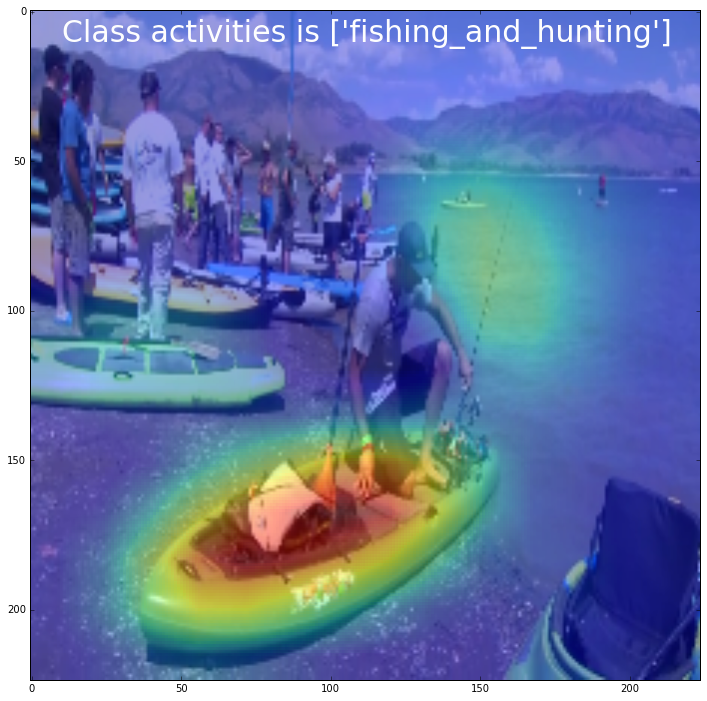

In [27]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/7.png", width=420)

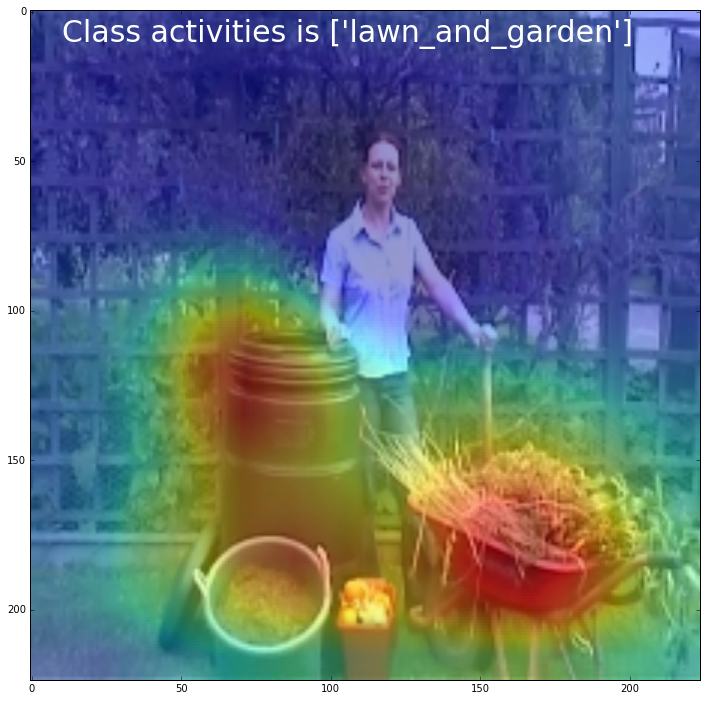

In [28]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/8.png", width=420)

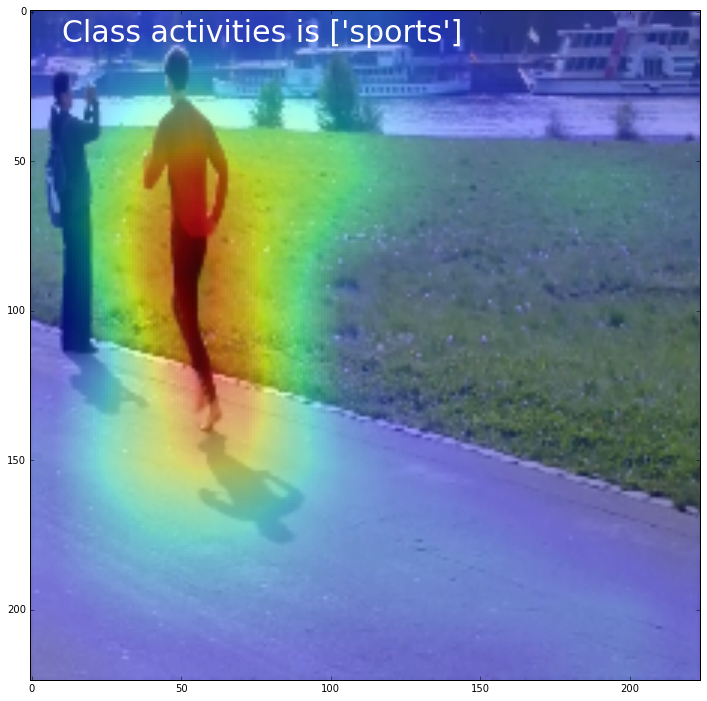

In [29]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/11.png", width=420)

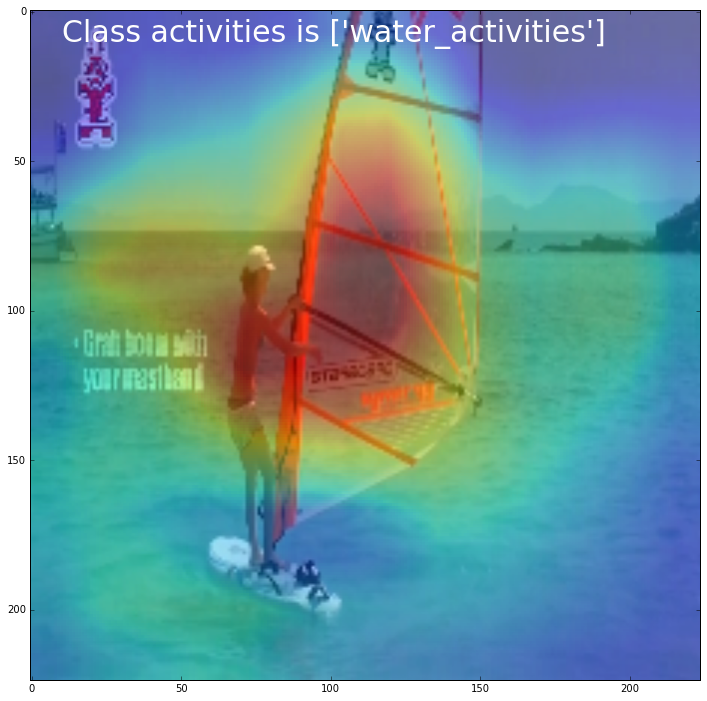

In [31]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/21.png", width=420)

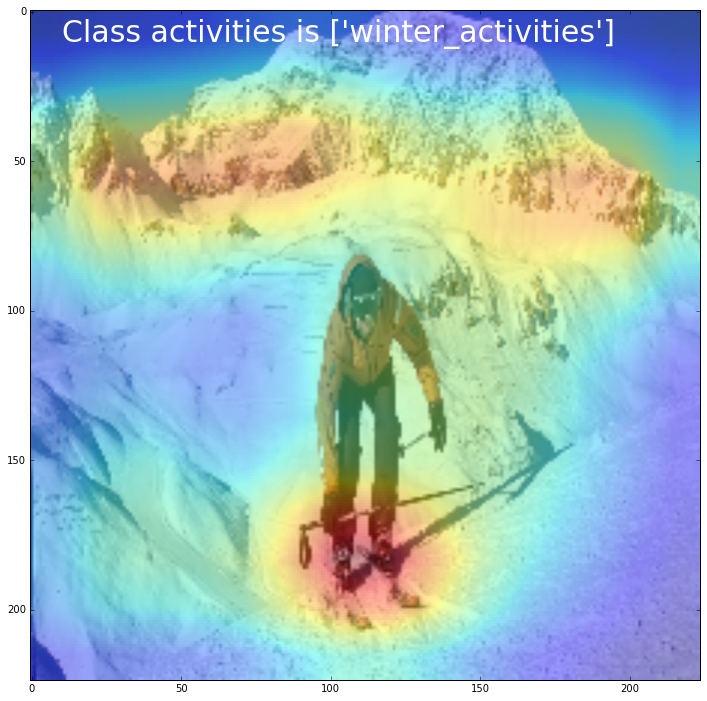

In [32]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/16.png", width=420)

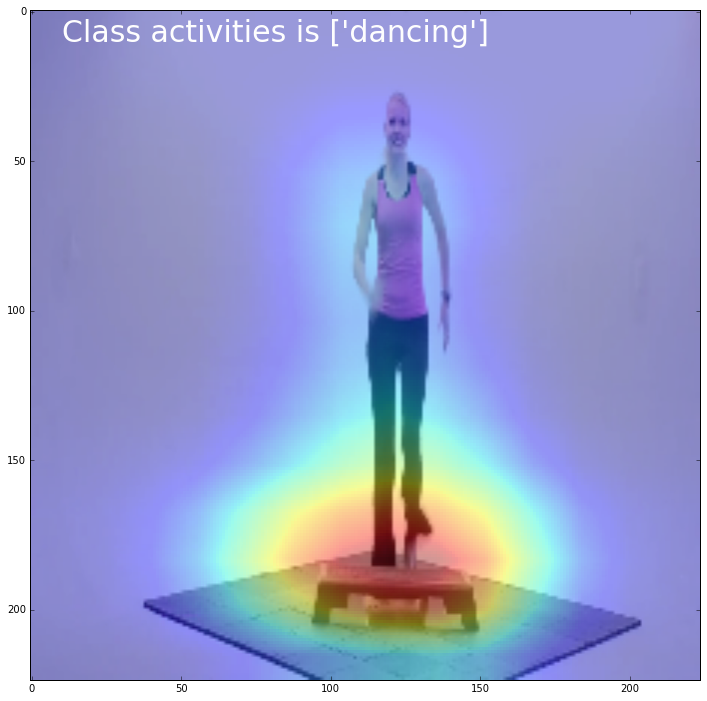

In [33]:
Image(filename="/home/veronika/materials/cv/CAM/images_examples/18.png", width=420)